In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
from tensorflow.keras import layers
from tensorflow.keras.applications import DenseNet121
from IPython.display import HTML


In [11]:
# load dataset

# sur colab
# TRAIN_IMAGES_PATH = "F:/Projet_computer_vision/plant-pathology-2021-fgvc8/train_images/"

# # en local
# TRAIN_IMAGES_PATH = "F:/Projet_computer_vision/plant-pathology-2021-fgvc8/compressed/train_images/"
# TEST_IMAGES_PATH = "F:/Projet_computer_vision/plant-pathology-2021-fgvc8/test_images/"
# sur colab
TRAIN_IMAGES_PATH = "drive/MyDrive/Colab Notebooks/Plant/train_images/"
TEST_IMAGES_PATH = "drive/MyDrive/Colab Notebooks/Plant/test_images/"

# en local
# TRAIN_PATH = "F:/Projet_computer_vision/plant-pathology-2021-fgvc8/compressed/train_comp.csv"
# SUB_PATH = "F:/Projet_computer_vision/plant-pathology-2021-fgvc8/sample_submission.csv"

# sur colab
TRAIN_PATH = "drive/MyDrive/Colab Notebooks/Plant/train_comp.csv"
SUB_PATH = "drive/MyDrive/Colab Notebooks/Plant/sample_submission.csv"

train_data = pd.read_csv(TRAIN_PATH)
print("train_data= " , train_data[:5],"\n")
test_data = pd.read_csv(SUB_PATH)
print("test_data= ", test_data,"\n")
# sub = pd.read_csv(SUB_PATH)

# bon 3
classes=set()
for v in train_data["labels"].values:
    classes.update(set(v.split()))
print("classes= ", classes,"\n")

#On peut associer les images des feuilles à 5 classes possibles:
#'complex', 'frog_eye_leaf_spot', 'powdery_mildew', 'rust', 'scab'
# healthy , quand aucune de ces classes n'est là.

train_data['scab']=train_data['labels'].apply(lambda x: 1 if 'scab' in x else 0) 
train_data['rust']=train_data['labels'].apply(lambda x: 1 if 'rust' in x else 0) 
train_data['powdery_mildew']=train_data['labels'].apply(lambda x: 1 if 'powdery_mildew' in x else 0) 
train_data['frog_eye_leaf_spot']=train_data['labels'].apply(lambda x: 1 if 'frog_eye_leaf_spot' in x else 0) 
train_data['complex']=train_data['labels'].apply(lambda x: 1 if 'complex' in x else 0) 
# train_data
print("train_data ave 5 colonnes de labels = ")
print(train_data[:3],"\n")


# sur colab
def add_path_compressed_train(file):
    return TRAIN_IMAGES_PATH  + file

def add_path_test(file):
    return TEST_IMAGES_PATH + file

train_files= train_data.image.map(add_path_compressed_train).values
print("train_files= \n", train_files[:3],"\n")

test_files= test_data.image.map(add_path_test).values
print("test_files= \n", test_files,"\n")

labels = np.float32(train_data.loc[:, 'scab':'complex'].values)
print("labels= \n ", labels[:3],"\n")

print("shapes= ", train_files.shape, labels.shape,"\n")

train_data=                               image                           labels
0  Compressed_800113bb65efe69e.jpg                          healthy
1  Compressed_8002cb321f8bfcdf.jpg  scab frog_eye_leaf_spot complex
2  Compressed_80070f7fb5e2ccaa.jpg                             scab
3  Compressed_80077517781fb94f.jpg                             scab
4  Compressed_800cbf0ff87721f8.jpg                          complex 

test_data=                    image   labels
0  85f8cb619c66b863.jpg  healthy
1  ad8770db05586b59.jpg  healthy
2  c7b03e718489f3ca.jpg  healthy 

classes=  {'scab', 'powdery_mildew', 'complex', 'frog_eye_leaf_spot', 'rust', 'healthy'} 

train_data ave 5 colonnes de labels = 
                             image  ... complex
0  Compressed_800113bb65efe69e.jpg  ...       0
1  Compressed_8002cb321f8bfcdf.jpg  ...       1
2  Compressed_80070f7fb5e2ccaa.jpg  ...       0

[3 rows x 7 columns] 

train_files= 
 ['drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_800113bb

In [5]:
# nombre d'images labellisées dans le data set
len(train_data)

18632

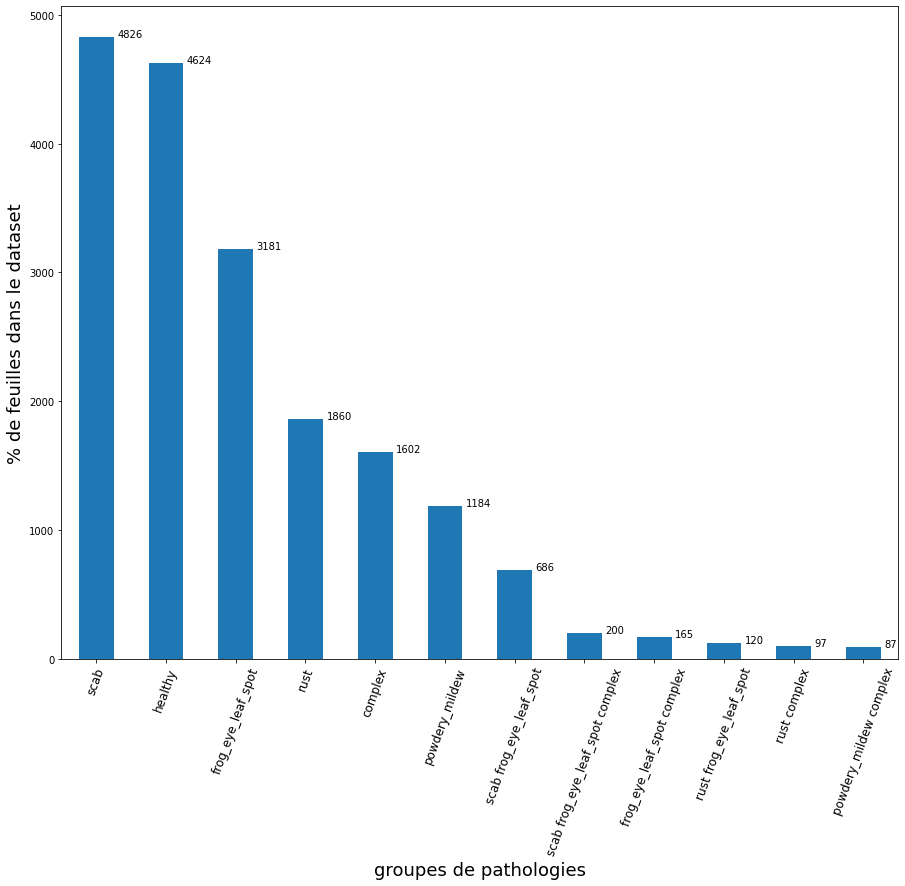

In [6]:
fig= plt.figure(figsize=(15,12))

ax = fig.subplots(1,1)
y=train_data['labels'].value_counts()
y.plot(ax=ax, kind='bar')
plt.ylabel('% de feuilles dans le dataset', fontsize=18)
plt.xlabel('groupes de pathologies', fontsize=18)
ax.tick_params(axis='x', which='major', labelsize=12, rotation=70)
# ax.set_xticklabels(xlabels, rotation=40, ha=ha[n])
for index, value in enumerate(y):
    plt.text(index+0.3, value+0.3, str(value))
plt.show()

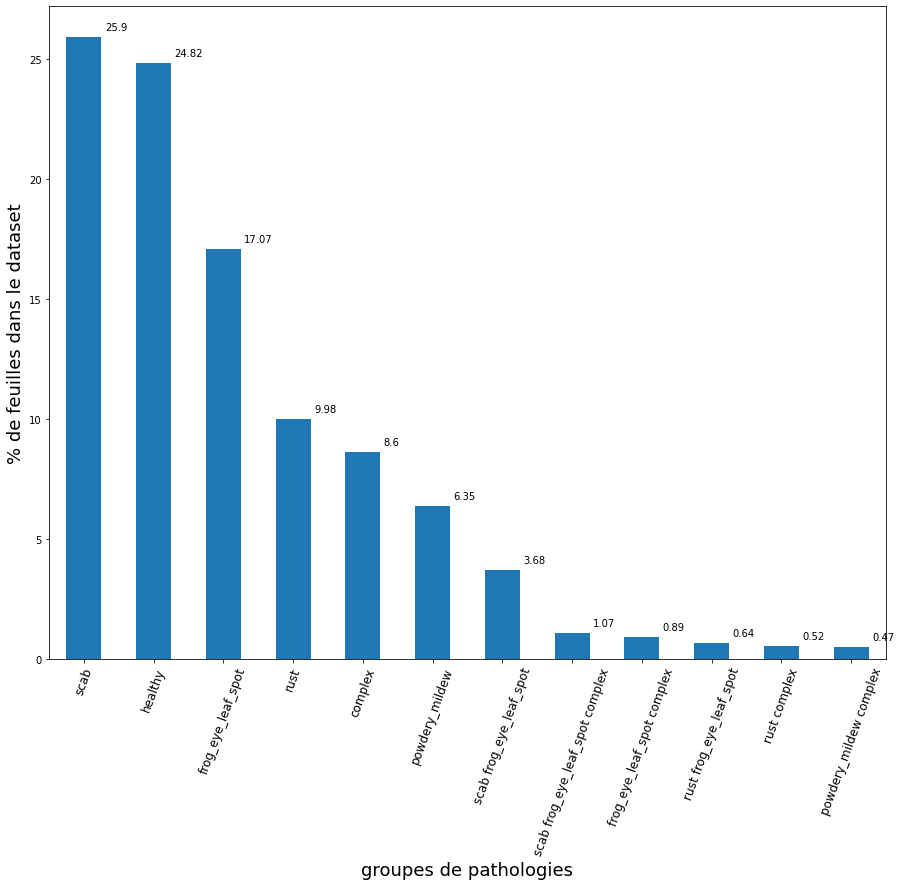

In [7]:
fig= plt.figure(figsize=(15,12))

ax = fig.subplots(1,1)
size_data_set=train_data['labels']
y=train_data['labels'].value_counts(normalize=True)*100
y.plot(ax=ax, kind='bar')
plt.ylabel('% de feuilles dans le dataset', fontsize=18)
plt.xlabel('groupes de pathologies', fontsize=18)
ax.tick_params(axis='x', which='major', labelsize=12, rotation=70)
# ax.set_xticklabels(xlabels, rotation=40, ha=ha[n])
for index, value in enumerate(y):
    plt.text(index+0.3, value+0.3, str(round(value,2)))
plt.show()

In [8]:
# dans la colonne lables du trai_data , on a les catégories suivantes :
classes=set()
for v in train_data["labels"].values:
    classes.update(set(v.split()))
print("# dans la colonne lables du trai_data , on a les catégories suivantes : \n")
print("classes= ", classes)


# dans la colonne lables du trai_data , on a les catégories suivantes : 

classes=  {'scab', 'powdery_mildew', 'complex', 'frog_eye_leaf_spot', 'rust', 'healthy'}


Dans le dataset, il y a 12 labels possibles, y a des labels qui correspondent à une pathologie ou à des groupes de pathologies ou pas de pathologie (healthy).<br>
Par  ordre de férquence : <br>
scab 25,9 % <br>
healthy 24.82 % <br>
frog_eye_leaf_spot 17.07 %<br> 
rust 9.98 %<br>
complex (plusieurs pathologies à la fois) 8.60 %<br>
powdery_mildew 6.35 %<br>
scab et frog_eye_leaf_spot 3.68 % <br> 
scab et frog_eye_leaf_spot  et complex 1.07 %<br>
frog_eye_leaf_spot et complex 0.89 %<br>
rust et frog_eye_leaf_spot  0.64 %<br>
rust et complex 0.52 %<br>
powdery_mildew et complex 0.47%<br>

On voit que les groupes: <b> scab, healthy et frog_eye_leaf_spot </b> sont plus fréquents que les autres.
Pour ce projet de classification, on a le choix entre réaliser un modèle de <b> classification multi-classes sur les 12 groupes ci-dessus mais single label </b> (chaque photo de feuille sera associé à un des  12 groupes ci-dessus) ou faire un modèle de <b> classification multi-classes sur les 5 pathologies : scab, rust,  powdery_mildew , frog_eye_leaf_spot  , complex et multi-labels </b>, une photo de feuille sera associée à une ou plusieurs de ces pathologies ou aucun de ces 5 pathologies et sera donc healthy.
J'ai opté pour cette 2ème manière de faire.

In [9]:
#On peut associer les images des feuilles à 5 classes possibles:
#'complex', 'frog_eye_leaf_spot', 'powdery_mildew', 'rust', 'scab'
# healthy , quand aucune de ces classes n'est là.

train_data['scab']=train_data['labels'].apply(lambda x: 1 if 'scab' in x else 0) 
train_data['rust']=train_data['labels'].apply(lambda x: 1 if 'rust' in x else 0) 
train_data['powdery_mildew']=train_data['labels'].apply(lambda x: 1 if 'powdery_mildew' in x else 0) 
train_data['frog_eye_leaf_spot']=train_data['labels'].apply(lambda x: 1 if 'frog_eye_leaf_spot' in x else 0) 
train_data['complex']=train_data['labels'].apply(lambda x: 1 if 'complex' in x else 0) 
HTML(train_data[:10].to_html())

# df = pd.DataFrame(triples_domain[0:1])
# HTML(df.to_html())

,image,labels,scab,rust,powdery_mildew,frog_eye_leaf_spot,complex
0,Compressed_800113bb65efe69e.jpg,healthy,0,0,0,0,0
1,Compressed_8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,1,0,0,1,1
2,Compressed_80070f7fb5e2ccaa.jpg,scab,1,0,0,0,0
3,Compressed_80077517781fb94f.jpg,scab,1,0,0,0,0
4,Compressed_800cbf0ff87721f8.jpg,complex,0,0,0,0,1
5,Compressed_800edef467d27c15.jpg,healthy,0,0,0,0,0
6,Compressed_800f85dc5f407aef.jpg,rust,0,1,0,0,0
7,Compressed_801d6dcd96e48ebc.jpg,healthy,0,0,0,0,0
8,Compressed_801f78399a44e7af.jpg,complex,0,0,0,0,1
9,Compressed_8021b94d437eb7d3.jpg,healthy,0,0,0,0,0


Afin de charger les images au fur à mesure pour les trainings sans encombrer la mémoire, on peut passer par 2 méthodes :
-	Méthode utilisant des  Datasets
-	Méthode utilisant des ImageDataGenerators
Pour la 1ère méthode , il faut donc transformer les fichiers des images des feuilles et le dataframe  des noms des fichiers et des labels en datasets : <b>PrefetchDataset</b> comme on le verra dans les notebooks.

Pour la 2ème  méthode , il faut donc transformer les fichiers des images des feuilles et le dataframe des noms des fichiers et des labels en <b>DataFrameIterator</b> comme on le verra dans les notebooks


In [14]:
def add_path_compressed_train(file):
    return TRAIN_IMAGES_PATH  + file


train_files= train_data.image.map(add_path_compressed_train).values
train_files[:5]

array(['drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_800113bb65efe69e.jpg',
       'drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_8002cb321f8bfcdf.jpg',
       'drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_80070f7fb5e2ccaa.jpg',
       'drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_80077517781fb94f.jpg',
       'drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_800cbf0ff87721f8.jpg'],
      dtype=object)

In [15]:
def add_path_test(file):
    return TEST_IMAGES_PATH + file

# 3 images de test pour la soumission à la compétition (test_data)
test_files= test_data.image.map(add_path_test).values
print(test_files)

['drive/MyDrive/Colab Notebooks/Plant/test_images/85f8cb619c66b863.jpg'
 'drive/MyDrive/Colab Notebooks/Plant/test_images/ad8770db05586b59.jpg'
 'drive/MyDrive/Colab Notebooks/Plant/test_images/c7b03e718489f3ca.jpg']


In [16]:
labels = np.float32(train_data.loc[:, 'scab':'complex'].values)
print("labels= ", labels[:3])

print("shapes= ", train_files.shape, labels.shape,)

labels=  [[0. 0. 0. 0. 0.]
 [1. 0. 0. 1. 1.]
 [1. 0. 0. 0. 0.]]
shapes=  (18632,) (18632, 5)


In [17]:
# split du dataset en training set et ne validation set 
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
train_images, valid_images, train_labels, valid_labels =\
        train_test_split(train_files, labels, test_size=0.15, random_state=2021)

In [18]:
# Pour la 1ère méthode des Datasets, il nous faudra convertir les fichiers des images des feuilles en tenseurs 
# avec la fonction decode_image ci-dessous :
def decode_image(filename,label=None,  image_size=(512, 512)):
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, image_size)
    if label is None:
        return image
    else:
        return image, label
    
# la dimension du tenseur est fixée à (512,512,3)
# Cette fonction va nous permettre de visualiser les photos des feuilles à partir du dataframe train_files (qui contient les noms des fichiers)

In [19]:
decode_image(train_files[0])

<tf.Tensor: shape=(512, 512, 3), dtype=float32, numpy=
array([[[0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        ...,
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667]],

       [[0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        ...,
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667]],

       [[0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        [0.30588236, 0.32156864, 0.23137255],
        ...,
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667],
        [0.6745098 , 0.61960787, 0.46666667]],

       ...,

       [[0.4627451 , 0.47843137, 0.3882353 ],
        [0.46

In [20]:
def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

In [22]:
# 1ère méthode des dataset
AUTO = tf.data.experimental.AUTOTUNE
batch_size =16
image_size=(100, 100)
train_dataset = (
        tf.data.Dataset
        .from_tensor_slices((train_images, train_labels))   
        #.from_tensor_slices((train_images[:10], train_labels[:10]))   
        .map(tf.autograph.experimental.do_not_convert(lambda x,y: decode_image(x,y, image_size)), num_parallel_calls=AUTO )           
        #.map(decode_image, num_parallel_calls=AUTO)
        .map(data_augment, num_parallel_calls=AUTO)
        .repeat()
        .shuffle(512)
        .batch(batch_size)
        .prefetch(AUTO)
    )
valid_dataset = (
        tf.data.Dataset
        .from_tensor_slices((valid_images, valid_labels))
        # .from_tensor_slices((valid_images[:2], valid_labels[:2]))
        # .map(decode_image, num_parallel_calls=AUTO)
        .map(tf.autograph.experimental.do_not_convert(lambda x,y: decode_image(x,y, image_size)), num_parallel_calls=AUTO )           
        .batch(batch_size)
        .cache()
        .prefetch(AUTO)
    )
test_dataset = (
        tf.data.Dataset
        .from_tensor_slices(test_files)
        .map(tf.autograph.experimental.do_not_convert(lambda x: decode_image(x,None, image_size)), num_parallel_calls=AUTO )           
        .batch(batch_size)
    )

In [23]:
train_dataset,valid_dataset,test_dataset

(<PrefetchDataset shapes: ((None, 100, 100, 3), (None, 5)), types: (tf.float32, tf.float32)>,
 <PrefetchDataset shapes: ((None, 100, 100, 3), (None, 5)), types: (tf.float32, tf.float32)>,
 <BatchDataset shapes: (None, 100, 100, 3), types: tf.float32>)

In [24]:
train_files[0]

'drive/MyDrive/Colab Notebooks/Plant/train_images/Compressed_800113bb65efe69e.jpg'

In [25]:
train_files[0].split('Compressed_')[1]

'800113bb65efe69e.jpg'

In [26]:
# fonction d'affichage des feuilles 
def display_images(train_files,train_data, rows_, cols_):
  fig = plt.figure(figsize=(15,15))
  for img in range(rows_*cols_):
    ax = fig.add_subplot(rows_,cols_,1+img)
    ax.imshow(decode_image(train_files[img]))
    ax.set_axis_off()
    ax.set_title( train_files[img].split('Compressed_')[1] + "\n" + train_data.labels[img].replace(" ", " / "), fontsize=16)
    

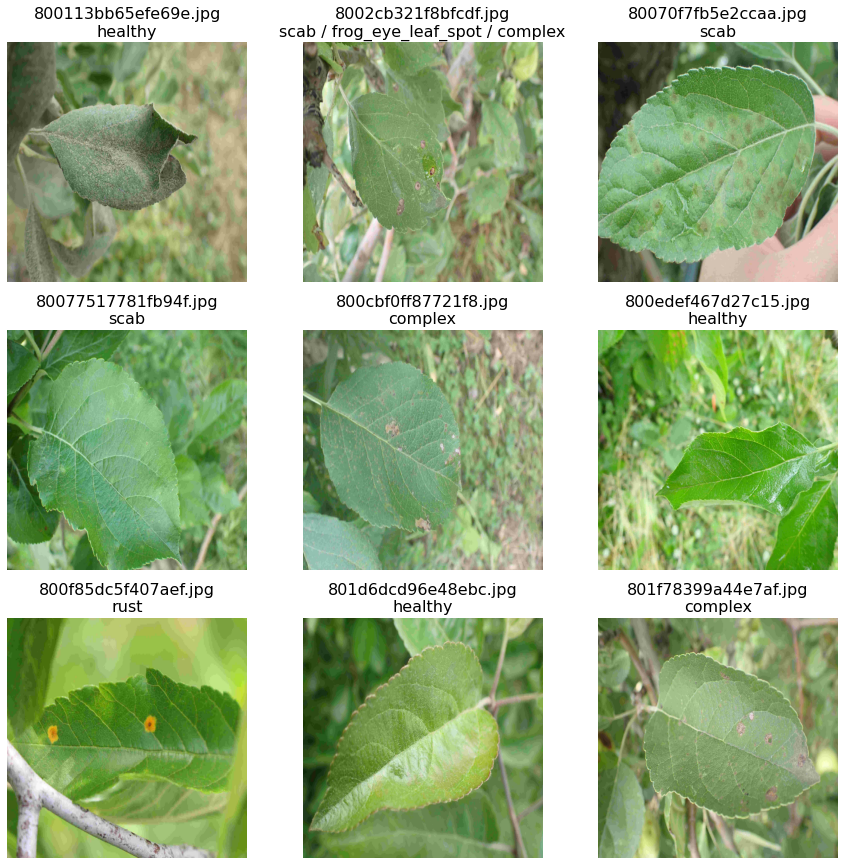

In [27]:
# affichage des 9 premières photos du train data
display_images(train_files,train_data, 3, 3)

In [28]:
train_data[train_data.labels=='healthy'][:3]

,image,labels,scab,rust,powdery_mildew,frog_eye_leaf_spot,complex
0,Compressed_800113bb65efe69e.jpg,healthy,0,0,0,0,0
5,Compressed_800edef467d27c15.jpg,healthy,0,0,0,0,0
7,Compressed_801d6dcd96e48ebc.jpg,healthy,0,0,0,0,0


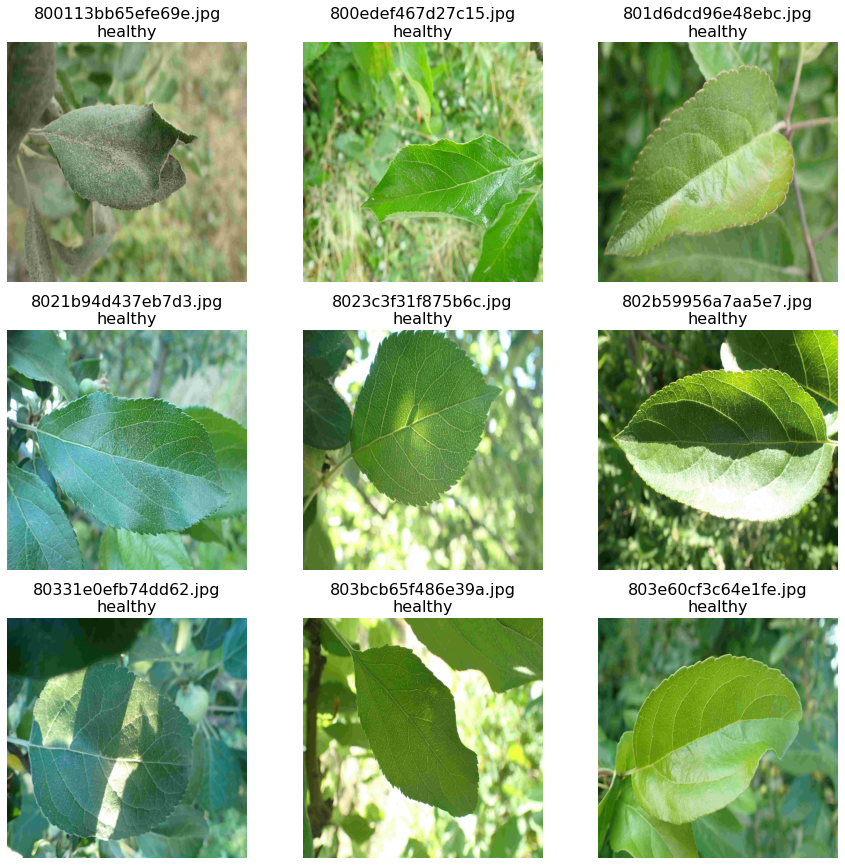

In [34]:
# feuilles healthy 
# on voit qu'il y a beaucoup de vert sur les feuilles 
df1= train_data[train_data.labels=='healthy'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

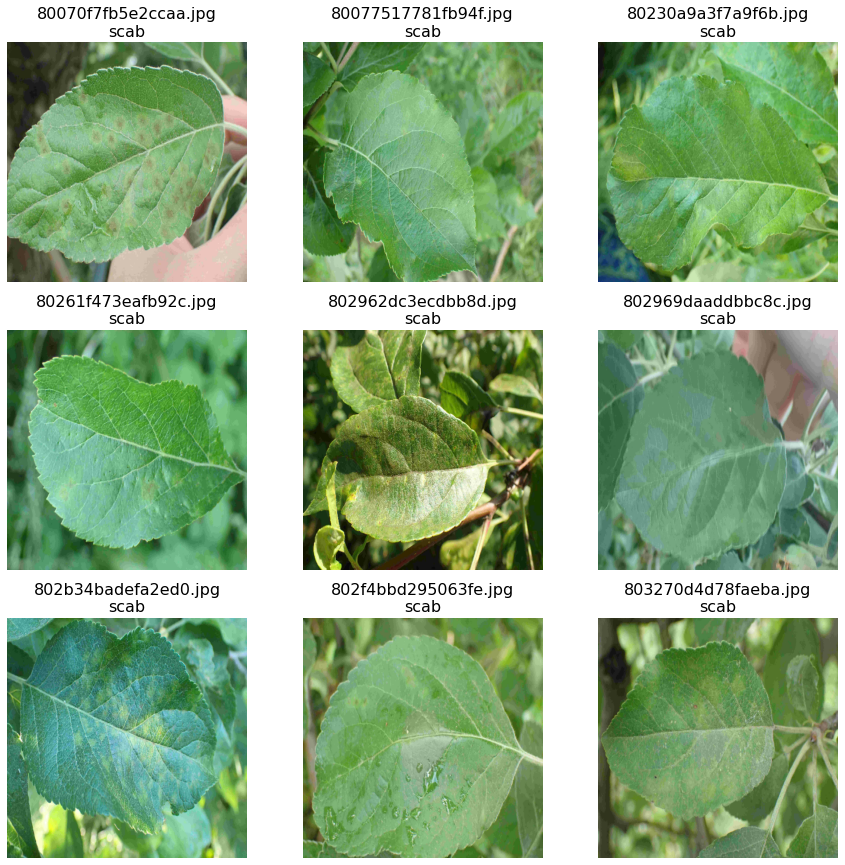

In [35]:
# feuilles avec la pathologie scab
# on voit que certaines ont très peu de symptômes de la  pathologie
# tâches plutôt brunes-gris.
df1= train_data[train_data.labels=='scab'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

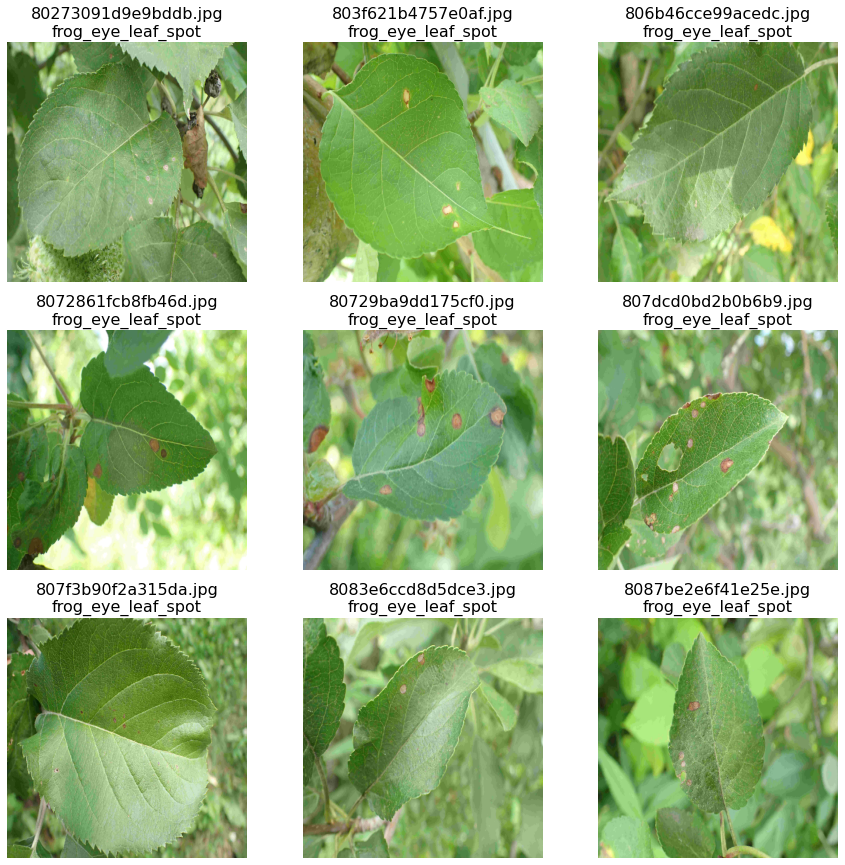

In [36]:
# feuilles avec la pathologie frog_eye_leaf_spot
# tâches plutôt brunes, avec des anneaux intérieurs et extérieurs
df1= train_data[train_data.labels=='frog_eye_leaf_spot'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

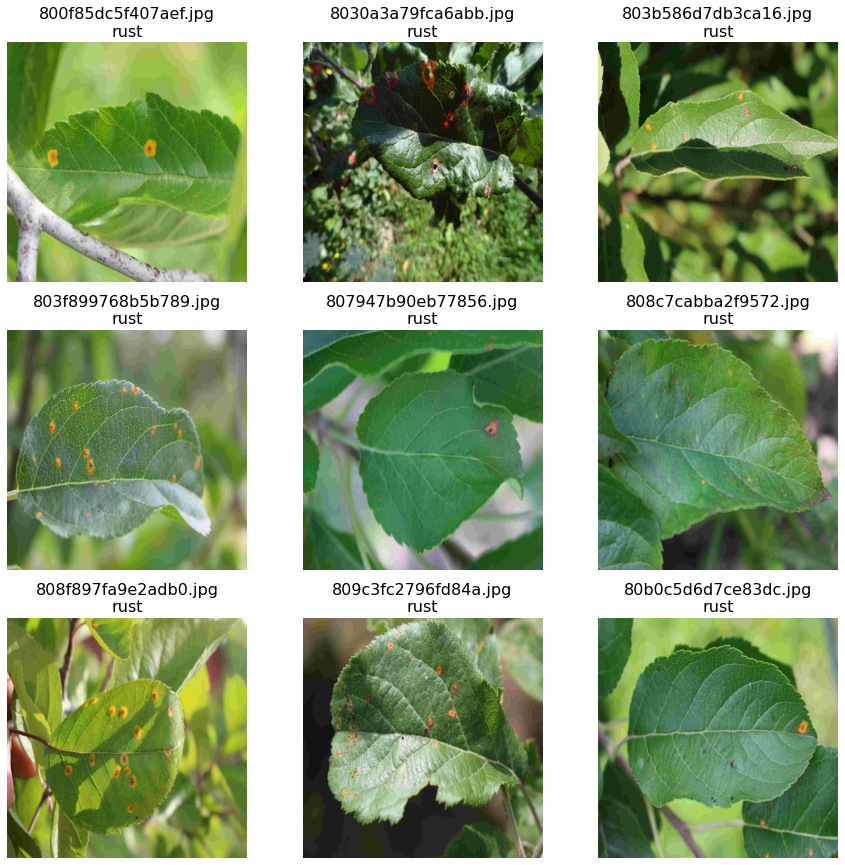

In [37]:
# feuilles avec la pathologie rust
# tâches jaunes rougeâtres
df1= train_data[train_data.labels=='rust'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

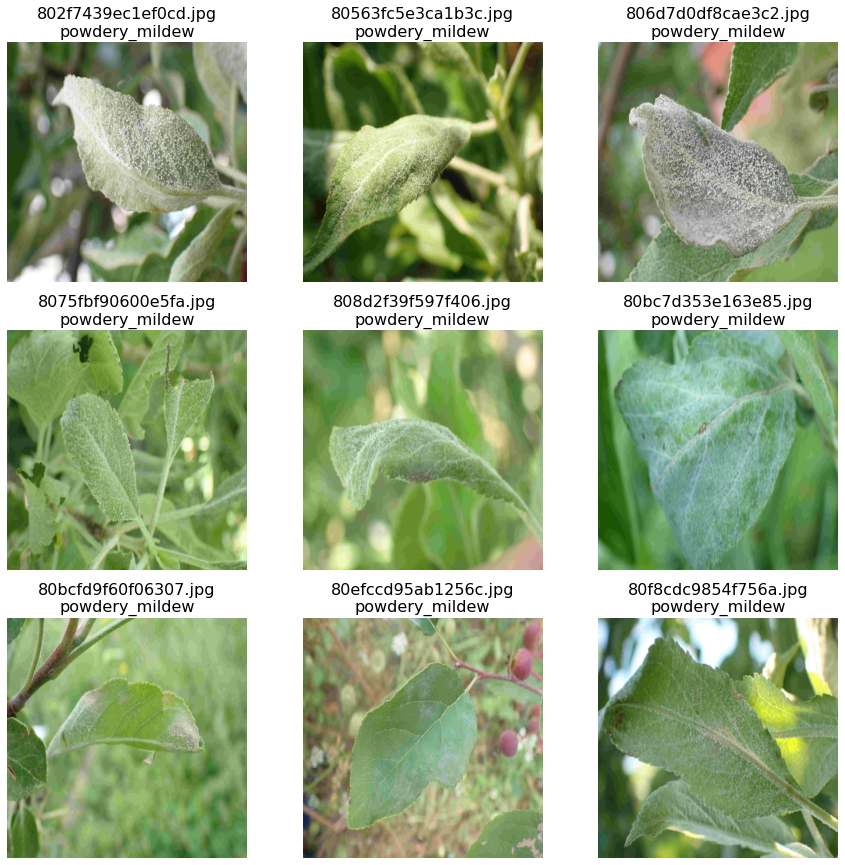

In [38]:
# feuilles avec la pathologie powdery_mildew
# tâches ressemblant à de la poudre blanche
df1= train_data[train_data.labels=='powdery_mildew'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

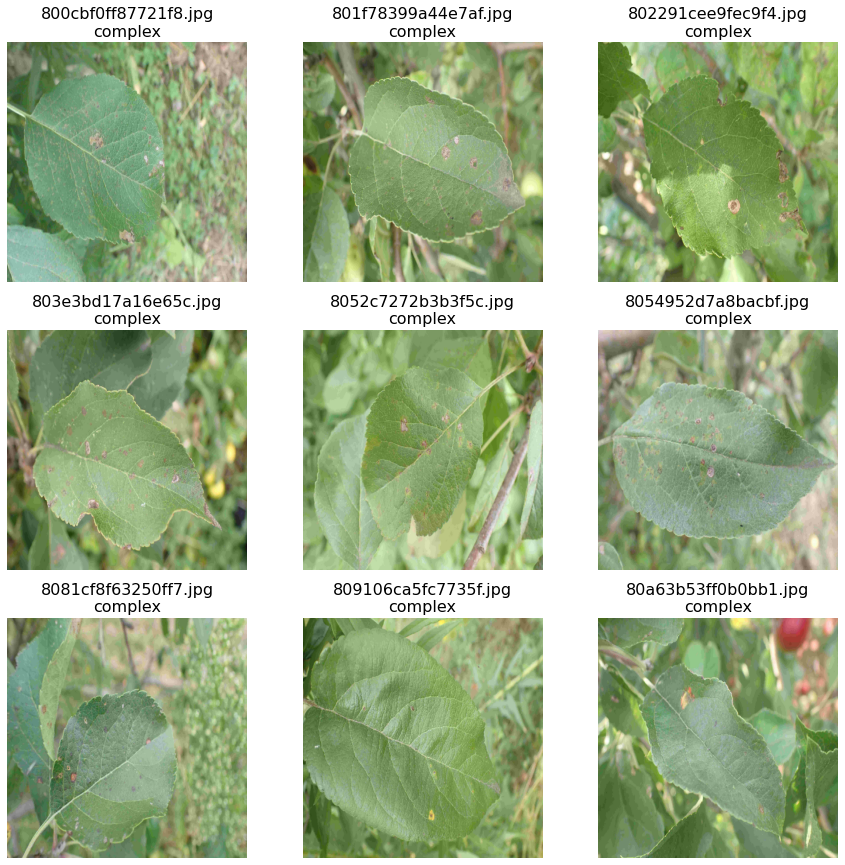

In [39]:
# feuilles avec la pathologie complex
# plusieurs maladies 
df1= train_data[train_data.labels=='complex'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

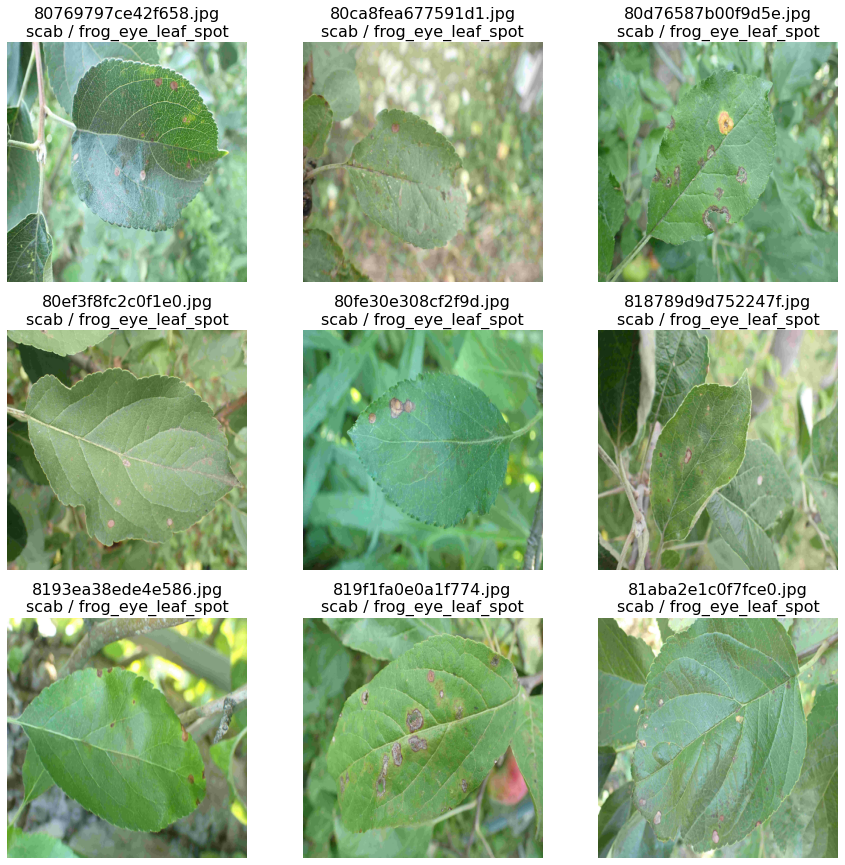

In [40]:
# feuilles avec les pathologies scab et frog_eye_leaf_spot

df1= train_data[train_data.labels=='scab frog_eye_leaf_spot'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

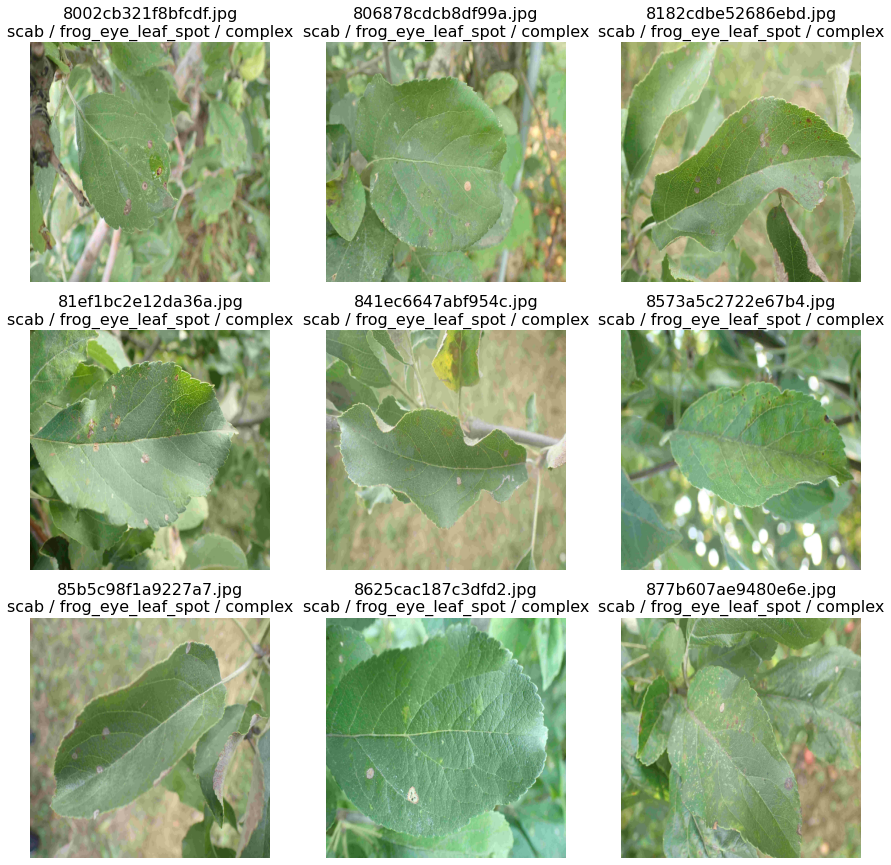

In [41]:
# feuilles avec les pathologies scab et frog_eye_leaf_spot et complex

df1= train_data[train_data.labels=='scab frog_eye_leaf_spot complex'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

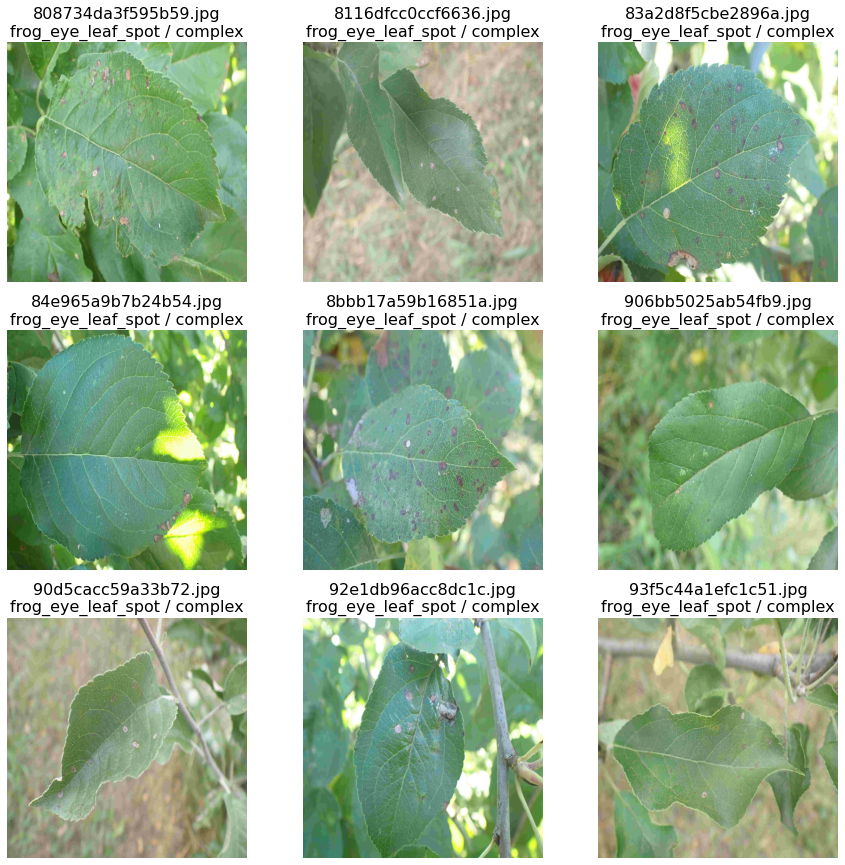

In [42]:
# feuilles avec les pathologies frog_eye_leaf_spot et complex

df1= train_data[train_data.labels=='frog_eye_leaf_spot complex'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

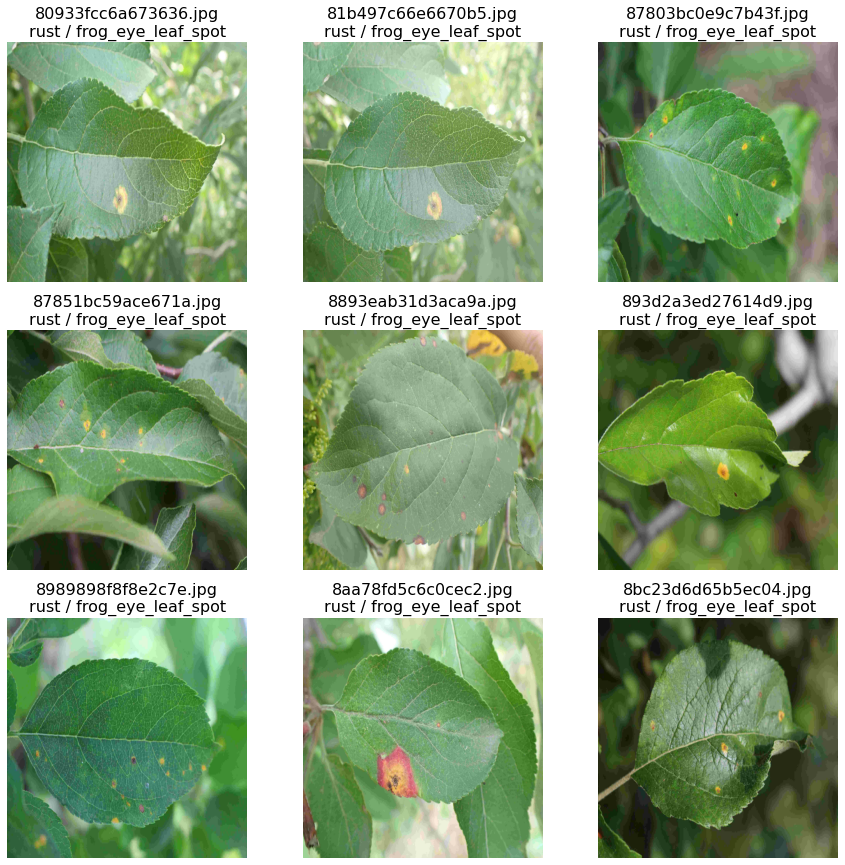

In [43]:
# feuilles avec les pathologies rust et frog_eye_leaf_spot

df1= train_data[train_data.labels=='rust frog_eye_leaf_spot'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

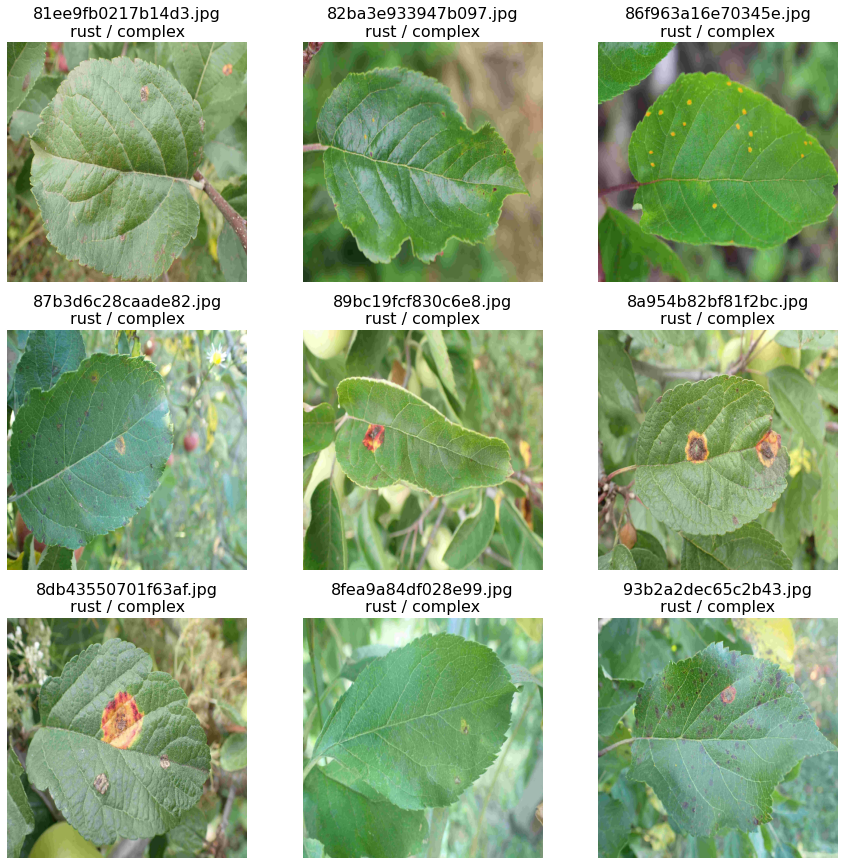

In [44]:
# feuilles avec les pathologies rust et complex

df1= train_data[train_data.labels=='rust complex'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

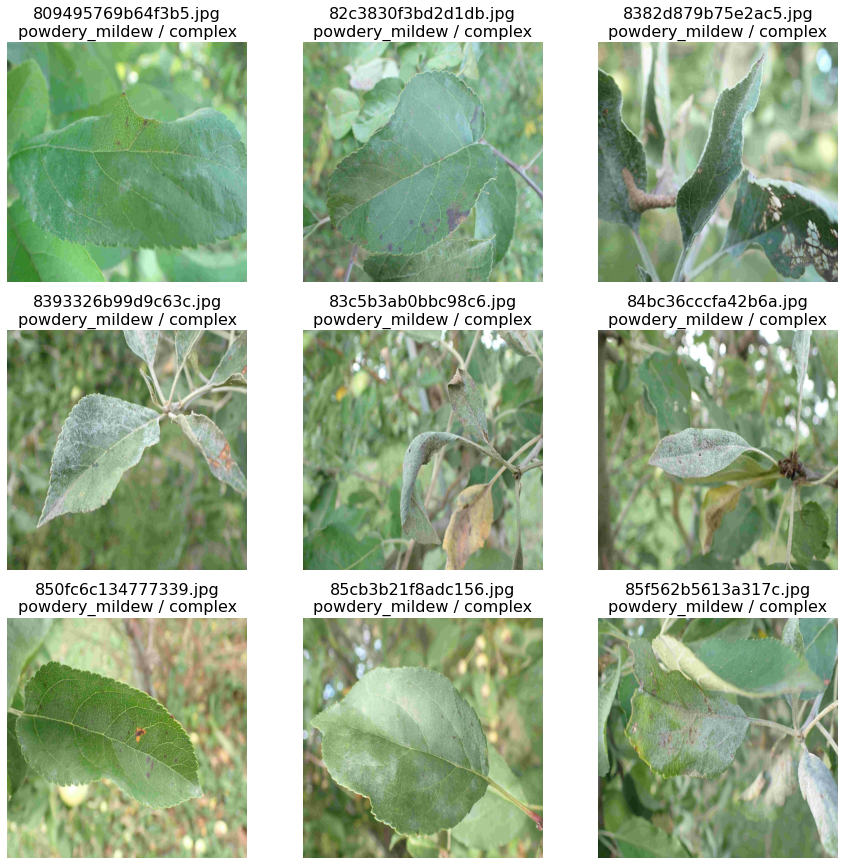

In [45]:
# feuilles avec les pathologies powdery_mildew et complex

df1= train_data[train_data.labels=='powdery_mildew complex'].reset_index(drop=True)
df='drive/MyDrive/Colab Notebooks/Plant/train_images/' + df1.image
display_images(df.to_numpy(),df1, 3, 3)

scab 25,9 % <br>
healthy 24.82 %<br>
frog_eye_leaf_spot 17.07 %<br>
rust 9.98 %<br>
complex (plusieurs pathologies à la fois) 8.60 %<br>
powdery_mildew 6.35 %<br>
scab et frog_eye_leaf_spot 3.68 %<br>
scab et frog_eye_leaf_spot et complex 1.07 %<br>
frog_eye_leaf_spot et complex 0.89 %<br>
rust et frog_eye_leaf_spot 0.64 %<br>
rust et complex 0.52 %<br>
powdery_mildew et complex 0.47%<br>